(Longitudinal Models of Change )=
# Longitudinal Models of Change

:::{post} January, 2023
:tags: hierarchical, longitudinal, 
:category: advanced, reference
:author: Nathaniel Forde
:::

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm

In [2]:
%config InlineBackend.figure_format = 'retina'  # high resolution figures
az.style.use("arviz-darkgrid")
rng = np.random.default_rng(42)

## Exploratory Data Analysis

In [41]:
df = pd.read_csv('../data/alcahol1_pp.csv')
df['peer_hi_lo'] = np.where(df['peer'] > df['peer'].mean(), 1, 0)
df

,id,age,coa,male,age_14,alcuse,peer,cpeer,ccoa,peer_hi_lo
0,1,14,1,0,0,1.732051,1.264911,0.246911,0.549,1
1,1,15,1,0,1,2.000000,1.264911,0.246911,0.549,1
2,1,16,1,0,2,2.000000,1.264911,0.246911,0.549,1
3,2,14,1,1,0,0.000000,0.894427,-0.123573,0.549,0
4,2,15,1,1,1,0.000000,0.894427,-0.123573,0.549,0
...,...,...,...,...,...,...,...,...,...,...
241,81,15,0,1,1,0.000000,1.549193,0.531193,-0.451,1
242,81,16,0,1,2,0.000000,1.549193,0.531193,-0.451,1
243,82,14,0,0,0,0.000000,2.190890,1.172890,-0.451,1
244,82,15,0,0,1,1.414214,2.190890,1.172890,-0.451,1


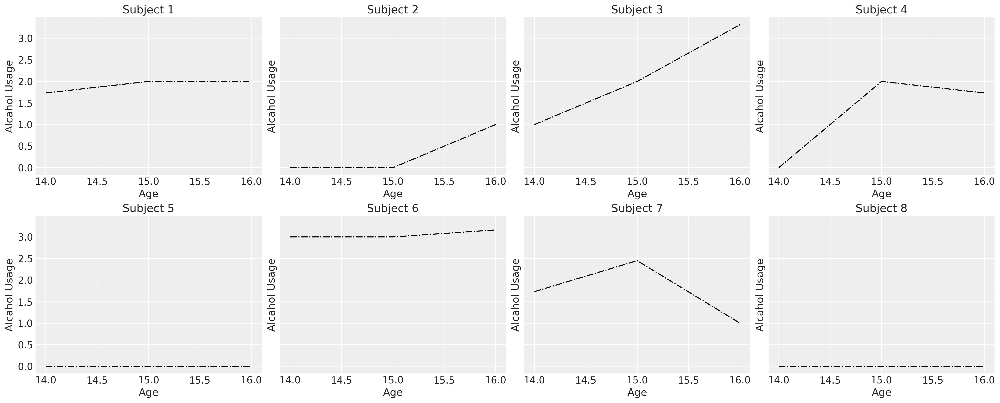

In [25]:
fig, axs = plt.subplots(2, 4, figsize=(20, 8), sharey=True)
axs = axs.flatten()
for i, ax in zip(df['id'].unique()[0:8], axs):
    temp = df[df['id'] == i].sort_values('age')
    ax.plot(temp['age'], temp['alcuse'], color='black', linestyle='dashdot')
    ax.set_title(f'Subject {i}')
    ax.set_ylabel("Alcahol Usage")
    ax.set_xlabel("Age")


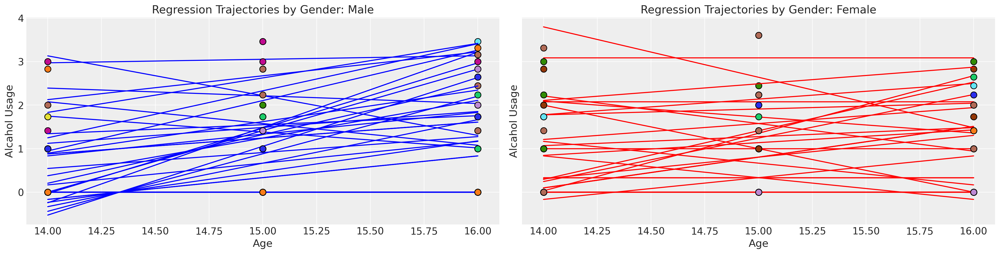

In [69]:
fig, axs = plt.subplots(1, 2, figsize=(20, 5), sharey=True)
lkup = {0: 'Male', 1:'Female'}
axs = axs.flatten()
for i in df['id'].unique():
    temp = df[df['id'] == i].sort_values('age')
    if temp['male'].values[0] == 1:
        color='blue'
        index = 0
    else: 
        color='red'
        index = 1
    params = np.polyfit(temp['age'], temp['alcuse'], 1)
    y = params[0]*temp['age'] + params[1]
    axs[index].plot(temp['age'], y, color=color)
    axs[index].plot(temp['age'], temp['alcuse'], 'o', mec='black', markersize=9)
    axs[index].set_title(f'Regression Trajectories by Gender: {lkup[index]}')
    axs[index].set_ylabel("Alcahol Usage")
    axs[index].set_xlabel("Age")

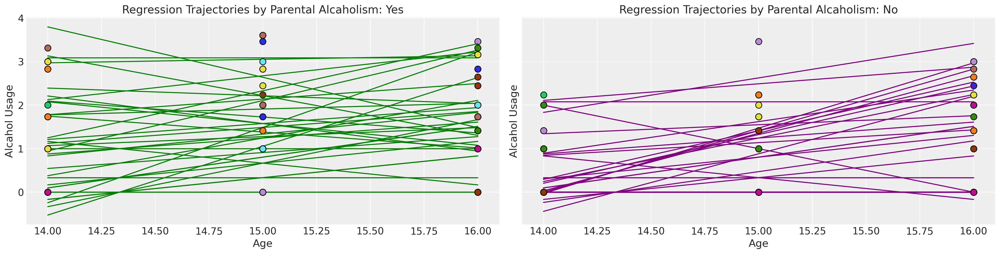

In [68]:
fig, axs = plt.subplots(1, 2, figsize=(20, 5), sharey=True)
lkup = {0: 'Yes', 1:'No'}
axs = axs.flatten()
for i in df['id'].unique():
    temp = df[df['id'] == i].sort_values('age')
    if temp['coa'].values[0] == 1:
        color='green'
        index = 0
    else: 
        color='purple'
        index = 1
    params = np.polyfit(temp['age'], temp['alcuse'], 1)
    y = params[0]*temp['age'] + params[1]
    axs[index].plot(temp['age'], y, color=color)
    axs[index].plot(temp['age'], temp['alcuse'], 'o', mec='black', markersize=9)
    axs[index].set_title(f'Regression Trajectories by Parental Alcaholism: {lkup[index]}')
    axs[index].set_ylabel("Alcahol Usage")
    axs[index].set_xlabel("Age")

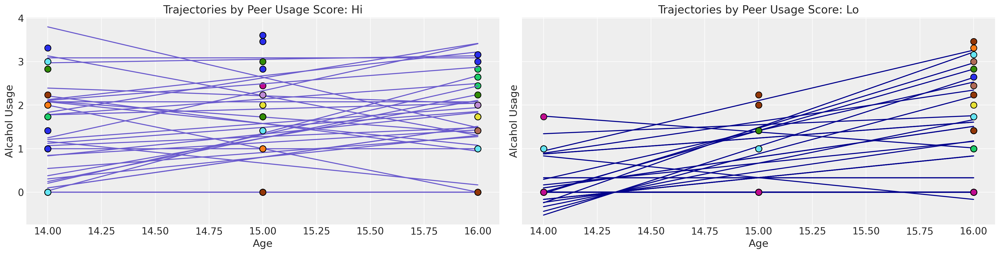

In [62]:
fig, axs = plt.subplots(1, 2, figsize=(20, 5), sharey=True)
lkup = {0: 'Hi', 1:'Lo'}
axs = axs.flatten()
for i in df['id'].unique():
    temp = df[df['id'] == i].sort_values('age')
    if temp['peer_hi_lo'].values[0] == 1:
        color='slateblue'
        index = 0
    else: 
        color='darkblue'
        index = 1
    params = np.polyfit(temp['age'], temp['alcuse'], 1)
    y = params[0]*temp['age'] + params[1]
    axs[index].plot(temp['age'], y, color=color)
    axs[index].plot(temp['age'], temp['alcuse'], 'o', mec='black', markersize=9)
    axs[index].set_title(f'Regression Trajectories by Peer Usage Score: {lkup[index]}')
    axs[index].set_ylabel("Alcahol Usage")
    axs[index].set_xlabel("Age")

### The Unconditional Mean Model



Sampling: [global_intercept, global_sigma, outcome, subject_intercept, subject_intercept_sigma]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [subject_intercept_sigma, subject_intercept, global_sigma, global_intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 33 seconds.
Sampling: [outcome]


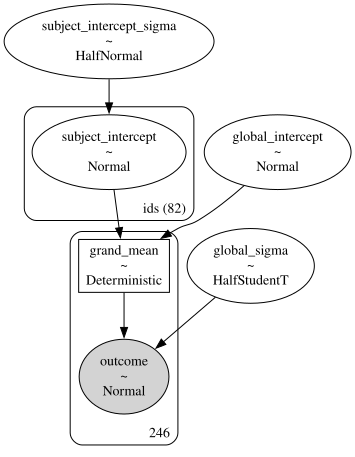

In [305]:
id_indx, unique_ids = pd.factorize(df['id'])
coords = {'ids': unique_ids}
with pm.Model(coords=coords) as model:
    subject_intercept_sigma = pm.HalfNormal('subject_intercept_sigma', 2)
    subject_intercept = pm.Normal('subject_intercept', 0, subject_intercept_sigma, dims='ids')
    global_sigma = pm.HalfStudentT('global_sigma', 1, 3)
    global_intercept = pm.Normal('global_intercept', 0, 1)
    grand_mean = pm.Deterministic('grand_mean', global_intercept + subject_intercept[id_indx])
    outcome = pm.Normal('outcome', grand_mean, global_sigma, observed=df['alcuse'])
    idata_m0 = pm.sample_prior_predictive()
    idata_m0.extend(pm.sample(random_seed=100, target_accept=0.95))
    idata_m0.extend(pm.sample_posterior_predictive(idata_m0))

pm.model_to_graphviz(model)

In [307]:
az.summary(idata_m0, var_names=['subject_intercept_sigma', 'global_intercept', 'global_sigma'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
subject_intercept_sigma,0.765,0.083,0.614,0.921,0.001,0.001,2980.0,2559.0,1.0
global_intercept,0.914,0.099,0.706,1.082,0.003,0.002,1261.0,1762.0,1.0
global_sigma,0.757,0.043,0.674,0.834,0.001,0.001,3336.0,3056.0,1.0


In [309]:
0.765 / (0.765 + 0.757)

0.5026281208935611

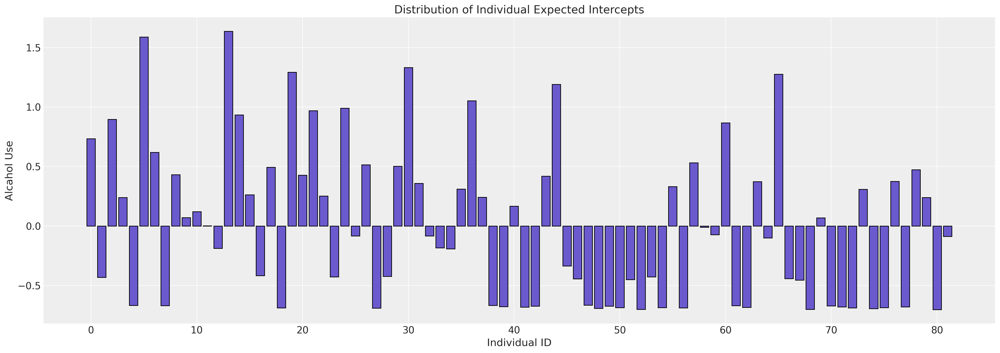

In [308]:
fig, ax = plt.subplots(figsize=(20, 7))
expected_individual_mean = idata_m0.posterior['subject_intercept'].mean(axis=1).values[0]
ax.bar(range(len(expected_individual_mean)), expected_individual_mean, color='slateblue', ec='black')
ax.set_xlabel("Individual ID")
ax.set_ylabel("Alcahol Use")
ax.set_title("Distribution of Individual Expected Intercepts");

## Unconditional Growth Model                                                                                                         

Sampling: [global_age_beta, global_intercept, global_sigma, outcome, subject_age_beta, subject_age_sigma, subject_intercept, subject_intercept_sigma]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [global_intercept, global_sigma, subject_intercept_sigma, subject_intercept, global_age_beta, subject_age_sigma, subject_age_beta]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 44 seconds.
Sampling: [outcome]


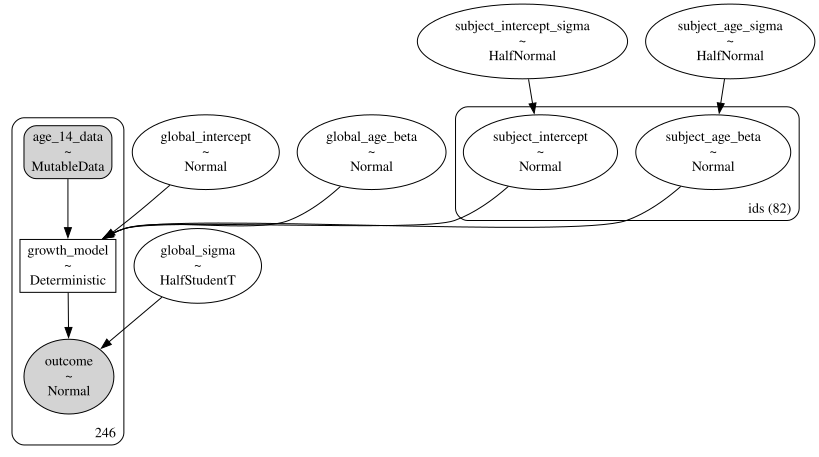

In [295]:
id_indx, unique_ids = pd.factorize(df['id'])
coords = {'ids': unique_ids}
with pm.Model(coords=coords) as model:
    age_14 = pm.MutableData('age_14_data', df['age_14'].values)

    ## Level 1
    global_intercept = pm.Normal('global_intercept', 0, 1)
    global_sigma = pm.HalfStudentT('global_sigma', 1, 3)
    global_age_beta = pm.Normal('global_age_beta', 0, 1)

    subject_intercept_sigma = pm.HalfNormal('subject_intercept_sigma', 5)
    subject_age_sigma = pm.HalfNormal('subject_age_sigma', 5)

    ## Level 2
    subject_intercept = pm.Normal('subject_intercept', 0, subject_intercept_sigma, dims='ids')
    subject_age_beta = pm.Normal('subject_age_beta', 0, subject_age_sigma, dims='ids')

    growth_model = pm.Deterministic('growth_model', (global_intercept + subject_intercept[id_indx]) + (global_age_beta + subject_age_beta[id_indx])*age_14)
    outcome = pm.Normal('outcome', growth_model, global_sigma, observed=df['alcuse'].values)
    idata_m1 = pm.sample_prior_predictive()
    idata_m1.extend(pm.sample(random_seed=100, target_accept=0.95))
    idata_m1.extend(pm.sample_posterior_predictive(idata_m1))

pm.model_to_graphviz(model)

array([[<AxesSubplot: title={'center': 'global_intercept'}>,
        <AxesSubplot: title={'center': 'global_intercept'}>],
       [<AxesSubplot: title={'center': 'subject_intercept'}>,
        <AxesSubplot: title={'center': 'subject_intercept'}>],
       [<AxesSubplot: title={'center': 'global_age_beta'}>,
        <AxesSubplot: title={'center': 'global_age_beta'}>],
       [<AxesSubplot: title={'center': 'subject_age_beta'}>,
        <AxesSubplot: title={'center': 'subject_age_beta'}>],
       [<AxesSubplot: title={'center': 'global_sigma'}>,
        <AxesSubplot: title={'center': 'global_sigma'}>],
       [<AxesSubplot: title={'center': 'subject_intercept_sigma'}>,
        <AxesSubplot: title={'center': 'subject_intercept_sigma'}>],
       [<AxesSubplot: title={'center': 'subject_age_sigma'}>,
        <AxesSubplot: title={'center': 'subject_age_sigma'}>],
       [<AxesSubplot: title={'center': 'growth_model'}>,
        <AxesSubplot: title={'center': 'growth_model'}>]], dtype=object)

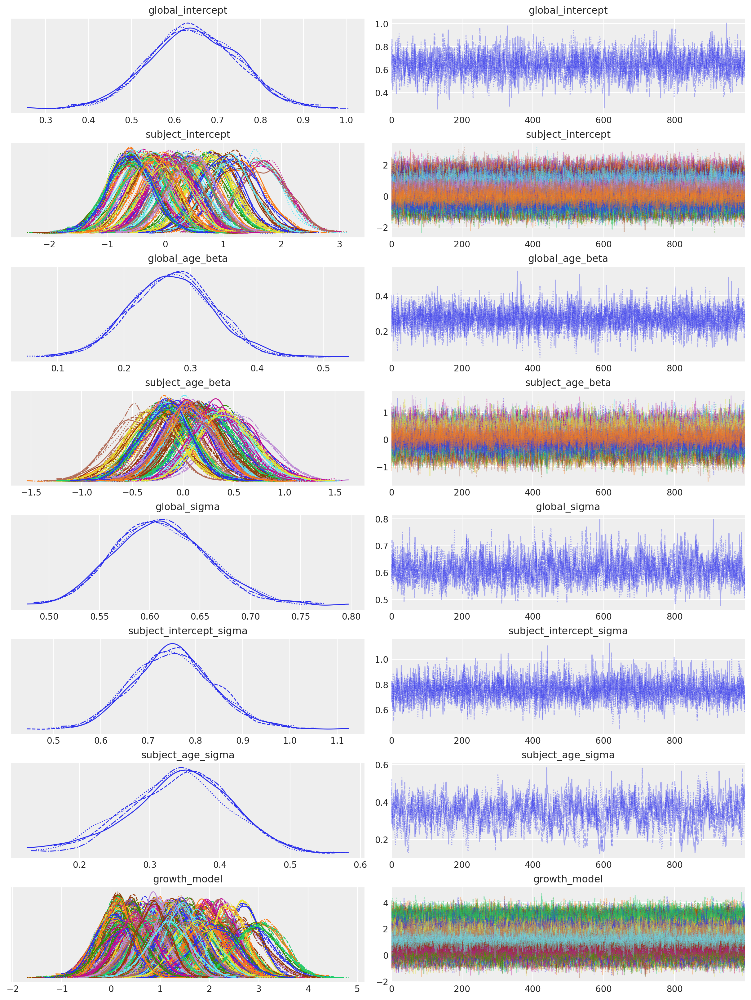

In [296]:
az.plot_trace(idata_m1);

In [301]:
az.summary(idata_m1, var_names=['global_intercept', 'global_sigma', 'global_age_beta', 'subject_intercept_sigma', 'subject_age_sigma'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
global_intercept,0.646,0.102,0.454,0.834,0.002,0.002,2065.0,2643.0,1.0
global_sigma,0.612,0.046,0.523,0.697,0.001,0.001,1272.0,1963.0,1.0
global_age_beta,0.272,0.062,0.162,0.390,0.001,0.001,4208.0,3300.0,1.0
subject_intercept_sigma,0.754,0.086,0.592,0.907,0.002,0.001,2716.0,2544.0,1.0
subject_age_sigma,0.343,0.072,0.205,0.473,0.003,0.002,576.0,756.0,1.0


In [302]:
az.extract(idata_m1, var_names=['subject_intercept', 'subject_age_beta']).to_dataframe()[['subject_intercept', 'subject_age_beta']].corr()

,subject_intercept,subject_age_beta
subject_intercept,1.00000,-0.06219
subject_age_beta,-0.06219,1.00000


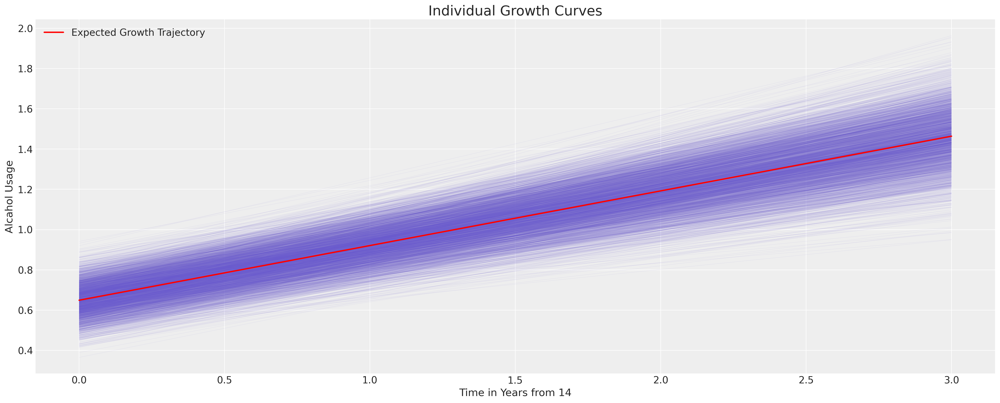

In [303]:
fig, ax = plt.subplots(figsize=(20, 8))
posterior = az.extract(idata_m1.posterior)
intercept_group_specific = posterior["subject_intercept"].mean(dim='ids')
slope_group_specific = posterior["subject_age_beta"].mean(dim='ids')
a = posterior['global_intercept'].mean() + intercept_group_specific
b = posterior['global_age_beta'].mean() + slope_group_specific
time_xi = xr.DataArray(np.arange(4))
ax.plot(time_xi, (a + b *time_xi).T, color="slateblue", alpha=0.2, lw=0.2);
ax.plot(time_xi, (a.mean() + b.mean() *time_xi), color="red", lw=2, label='Expected Growth Trajectory');
ax.set_ylabel("Alcahol Usage")
ax.set_xlabel("Time in Years from 14")
ax.legend()
ax.set_title("Individual Growth Curves", fontsize=20);


## Comparison of Model Estimates

array([<AxesSubplot: >], dtype=object)

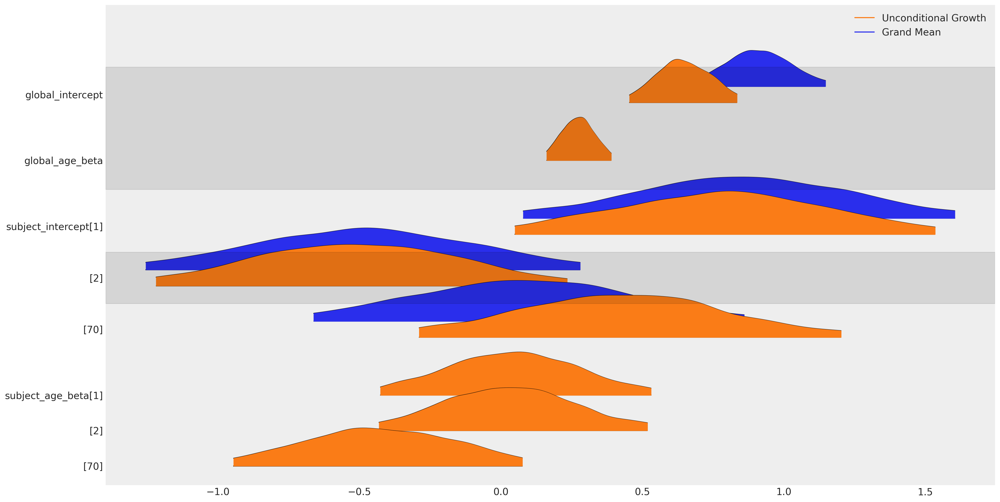

In [304]:
az.plot_forest([idata_m0, idata_m1], model_names=['Grand Mean', 'Unconditional Growth'],
 var_names=['global_intercept', 'global_age_beta', 'subject_intercept', 'subject_age_beta'], 
 figsize=(20, 10), kind='ridgeplot', combined=True, coords={'ids': [1, 2, 70]})

## Authors
- Authored by [Nathaniel Forde](https://nathanielf.github.io/) in January 2023 

## References
:::{bibliography}
:filter: docname in docnames
:::


In [3]:
%load_ext watermark
%watermark -n -u -v -iv -w -p pytensor

Last updated: Fri Jan 27 2023

Python implementation: CPython
Python version       : 3.11.0
IPython version      : 8.8.0

pytensor: 2.8.11

pymc      : 5.0.1
pandas    : 1.5.2
numpy     : 1.24.1
arviz     : 0.14.0
sys       : 3.11.0 | packaged by conda-forge | (main, Jan 15 2023, 05:44:48) [Clang 14.0.6 ]
matplotlib: 3.6.3

Watermark: 2.3.1

